You will need to request an access token at brazil datacube 

In [5]:
!pip install wtss

In [6]:
from wtss import WTSS

In [7]:
service = WTSS('https://brazildatacube.dpi.inpe.br/', access_token='your token')

In [8]:
service.coverages

['LANDSAT-MOZ_30_1M_STK-1',
 'MOD13Q1-6',
 'LC8_30_6M_MEDSTK-1',
 'MYD13Q1-6',
 'S2-SEN2COR_10_16D_STK-1',
 'CB4_64_16D_STK-1',
 'LC8_30_16D_STK-1',
 'CB4MUX_20_1M_STK-1']

In [9]:
cbers4_coverage = service['CB4_64_16D_STK-1']
cbers4_coverage


name,common name,description,datatype,valid range,scale,nodata
NDVI,ndvi,Normalized Difference Vegetation Index,int16,"{'min': -10000.0, 'max': 10000.0}",0.0001,-9999.0
BAND16,nir,Band 16 (nir),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
CMASK,quality,Cloud Mask,uint8,"{'min': 0.0, 'max': 255.0}",1.0,0.0
BAND13,blue,Band 13 (blue),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
BAND14,green,Band 14 (green),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
BAND15,red,Band 15 (red),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
CLEAROB,ClearOb,Clear Observation Count,uint8,"{'min': 1.0, 'max': 255.0}",1.0,0.0
PROVENANCE,Provenance,Provenance value Day of Year,int16,"{'min': 1.0, 'max': 366.0}",1.0,-1.0
TOTALOB,TotalOb,Total Observation Count,uint8,"{'min': 1.0, 'max': 255.0}",1.0,0.0
EVI,evi,Enhanced Vegetation Index,int16,"{'min': -10000.0, 'max': 10000.0}",0.0001,-9999.0


In [10]:
red_band = 'BAND15'
nir_band = 'BAND16'

-3.465305, -55.126648 WAS -16.350000,-56.666668 

In [11]:
time_series = cbers4_coverage.ts(attributes=(red_band, nir_band),
                                 latitude=-16.350000,
                                 longitude=-56.666668 ,
                                 start_date="2016-01-01",
                                 end_date="2022-03-21")

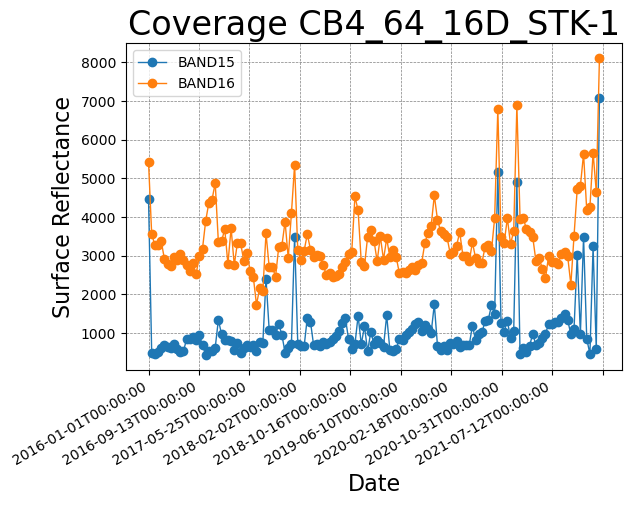

In [12]:
time_series.plot()

https://github.com/brazil-data-cube/code-gallery/blob/master/jupyter/Python/wtss/wtss-examples.ipynb

# PLOT TIME SERIES

In [13]:
import pandas as pd
import plotly.express as px

In [14]:
cbers_df = pd.DataFrame({ 'BAND15': time_series.BAND15, 'BAND16': time_series.BAND16 }, 
                        index = pd.to_datetime(time_series.timeline))

cbers_df

,BAND15,BAND16
2016-01-01,4466.0,5422.0
2016-01-17,473.0,3550.0
2016-02-02,466.0,3278.0
2016-02-18,503.0,3285.0
2016-03-05,601.0,3375.0
...,...,...
2022-01-01,853.0,4178.0
2022-01-17,454.0,4252.0
2022-02-02,3238.0,5667.0
2022-02-18,588.0,4657.0


In [15]:
fig = px.line(cbers_df, x=cbers_df.index, y=['BAND15', 'BAND16'], title='CBERS-4/AWFI (BAND 15 and 16)', labels={
    'index': 'Date',
    'value': 'Spectral Reflectance (scaled)'
})

fig.update_xaxes(rangeslider_visible=True)
fig.show()

# Cloud MASKS -- compare to already generated maps...

In [16]:
cbers4_coverage

name,common name,description,datatype,valid range,scale,nodata
NDVI,ndvi,Normalized Difference Vegetation Index,int16,"{'min': -10000.0, 'max': 10000.0}",0.0001,-9999.0
BAND16,nir,Band 16 (nir),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
CMASK,quality,Cloud Mask,uint8,"{'min': 0.0, 'max': 255.0}",1.0,0.0
BAND13,blue,Band 13 (blue),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
BAND14,green,Band 14 (green),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
BAND15,red,Band 15 (red),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
CLEAROB,ClearOb,Clear Observation Count,uint8,"{'min': 1.0, 'max': 255.0}",1.0,0.0
PROVENANCE,Provenance,Provenance value Day of Year,int16,"{'min': 1.0, 'max': 366.0}",1.0,-1.0
TOTALOB,TotalOb,Total Observation Count,uint8,"{'min': 1.0, 'max': 255.0}",1.0,0.0
EVI,evi,Enhanced Vegetation Index,int16,"{'min': -10000.0, 'max': 10000.0}",0.0001,-9999.0


In [43]:
cb4_timeseries_cmask = cbers4_coverage.ts(

    attributes = ('CMASK'),

    latitude = -12.0,
    longitude = -53.989,

    start_date = "2017-01-01",
    end_date = "2021-03-21"
)

cb4_timeseries_cmask


Time Series CB4_64_16D_STK-1
 
 
 
 
 CMASK: [127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0]
 
 
 
 
 timeline 
 
 
 
 2017-01-01T00:00:00 2017-01-17T00:00:00 2017-02-02T00:00:00 2017-02-18T00:00:00 2017-03-06T00:00:00 2017-03-22T00:00:00 2017-04-07T00:00:00 2017-04-23T00:00:00 2017-05-09T00:00:00 2017-05-25T00:00:00 2017-06-10T00:00:00 2017-06-26T00:00:00 2017-07-12T00:00:00 2017-07-28T00:00:00 2017-08-13T00:00:00 2017-08-29T00:00:00 2017-09-14T00:00:00 2017-09-30T00:00:00 2017-10-16T00:00:00 2017-11-01T00:00:00 2017-11-17T00:00:00 2017-12-03T00:00:00 2017-12-19T00:00:00 2018-01-01T00:00:00 2018-01-17T00:00:00 2018-02-02T00:00:00 2018-02-18T00:00:00 2018-03-06T00:00:00 2018-03-22T00:00:00 2018-04-07T00:00:00 2018-04-23T00:00:00 2018-05-09T00:00:00 2018-05-25T00:00:00 2018-06-10T00:00:00 2018-06-26T00:00:00 2018-07-12T00:00:00 2018-07-28T00:00:00 2018-08-13T00:00:00 2018-08-29T00:00:00 2018-09-14T00:00:00 2018-09-30T00:00:00 2018-10-16T00:00:00 2018-11-01T00:00:00 2018-11-17T00:00:00 2018-12-03T00:00:00 2018-12-19T00:00:00 2019-01-01T00:00:00 2019-01-17T00:00:00 2019-02-02T00:00:00 2019-02-18T00:00:00 2019-03-06T00:00:00 2019-03-22T00:00:00 2019-04-07T00:00:00 2019-04-23T00:00:00 2019-05-09T00:00:00 2019-05-25T00:00:00 2019-06-10T00:00:00 2019-06-26T00:00:00 2019-07-12T00:00:00 2019-07-28T00:00:00 2019-08-13T00:00:00 2019-08-29T00:00:00 2019-09-14T00:00:00 2019-09-30T00:00:00 2019-10-16T00:00:00 2019-11-01T00:00:00 2019-11-17T00:00:00 2019-12-03T00:00:00 2019-12-19T00:00:00 2020-01-01T00:00:00 2020-01-17T00:00:00 2020-02-02T00:00:00 2020-02-18T00:00:00 2020-03-05T00:00:00 2020-03-21T00:00:00 2020-04-06T00:00:00 2020-04-22T00:00:00 2020-05-08T00:00:00 2020-05-24T00:00:00 2020-06-09T00:00:00 2020-06-25T00:00:00 2020-07-11T00:00:00 2020-07-27T00:00:00 2020-08-12T00:00:00 2020-08-28T00:00:00 2020-09-13T00:00:00 2020-09-29T00:00:00 2020-10-15T00:00:00 2020-10-31T00:00:00 2020-11-16T00:00:00 2020-12-02T00:00:00 2020-12-18T00:00:00 2021-01-01T00:00:00 2021-01-17T00:00:00 2021-02-02T00:00:00 2021-02-18T00:00:00 2021-03-06T00:00:00

In [44]:
set(cb4_timeseries_cmask.values('CMASK'))

{127.0, 255.0}

In [46]:
cb4_timeseries = cbers4_coverage.ts(

    attributes = ('NDVI', 'CMASK'),

    latitude = -12.0,
    longitude = -53.989,

    start_date = "2017-01-01",
    end_date = "2021-03-21"

)

In [47]:
ndvi_timeline = pd.to_datetime(cb4_timeseries.timeline)
ndvi_timeline

DatetimeIndex(['2017-01-01', '2017-01-17', '2017-02-02', '2017-02-18',
               '2017-03-06', '2017-03-22', '2017-04-07', '2017-04-23',
               '2017-05-09', '2017-05-25', '2017-06-10', '2017-06-26',
               '2017-07-12', '2017-07-28', '2017-08-13', '2017-08-29',
               '2017-09-14', '2017-09-30', '2017-10-16', '2017-11-01',
               '2017-11-17', '2017-12-03', '2017-12-19', '2018-01-01',
               '2018-01-17', '2018-02-02', '2018-02-18', '2018-03-06',
               '2018-03-22', '2018-04-07', '2018-04-23', '2018-05-09',
               '2018-05-25', '2018-06-10', '2018-06-26', '2018-07-12',
               '2018-07-28', '2018-08-13', '2018-08-29', '2018-09-14',
               '2018-09-30', '2018-10-16', '2018-11-01', '2018-11-17',
               '2018-12-03', '2018-12-19', '2019-01-01', '2019-01-17',
               '2019-02-02', '2019-02-18', '2019-03-06', '2019-03-22',
               '2019-04-07', '2019-04-23', '2019-05-09', '2019-05-25',
      

In [48]:
import numpy as np

ndvi_data = np.array(cb4_timeseries.NDVI)
ndvi_data

cmask_data = np.array(cb4_timeseries.CMASK)
cmask_data


array([127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 255., 127., 127., 127., 255., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 255., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 255.])

In [49]:
cmask_data = np.where(cmask_data == 255, np.nan, 1)
cmask_data

array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1., nan,  1.,  1.,
        1., nan,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1., nan,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1., nan])

In [50]:
ndvi_data * cmask_data

array([8234., 6149., 5697., 7765., 7866., 8144., 6732., 8380., 7247.,
       8154., 8255., 8173., 8413., 8303., 7614., 7864., 7899., 8051.,
       7831., 6371., 6806., 5272., 7820.,   nan, 7352., 7913., 5274.,
         nan, 6995., 7289., 8188., 8300., 7341., 7990., 7832., 8015.,
       8154., 6255., 8215., 5710., 5848., 8188., 6561., 5739., 8350.,
       6864., 7616., 7968., 7707., 4907., 8264., 7459., 6665., 8163.,
       6667., 7285., 7927., 7963., 8487., 8482., 4584., 7631., 5647.,
       7461., 8281., 4315., 6344., 7266., 8640., 7621., 4524., 8371.,
         nan, 6131., 8624., 7337., 8644., 8248., 7832., 7884., 7865.,
       8110., 8317., 8173., 7043., 5535., 8616., 8159., 7778., 8459.,
       4472., 5533., 4958., 7051., 6736., 4292.,   nan])

In [51]:
ndvi_masked_data = pd.DataFrame({ 'data': ndvi_data * cmask_data }, index = pd.to_datetime(ndvi_timeline))
ndvi_masked_data

,data
2017-01-01,8234.0
2017-01-17,6149.0
2017-02-02,5697.0
2017-02-18,7765.0
2017-03-06,7866.0
...,...
2021-01-01,4958.0
2021-01-17,7051.0
2021-02-02,6736.0
2021-02-18,4292.0


In [52]:
ndvi_masked_data[ndvi_masked_data['data'].isna()]

,data
2018-01-01,NaN
2018-03-06,NaN
2020-02-18,NaN
2021-03-06,NaN


In [53]:
ndvi_masked_data_interpolated = ndvi_masked_data.interpolate()
ndvi_masked_data_interpolated

,data
2017-01-01,8234.0
2017-01-17,6149.0
2017-02-02,5697.0
2017-02-18,7765.0
2017-03-06,7866.0
...,...
2021-01-01,4958.0
2021-01-17,7051.0
2021-02-02,6736.0
2021-02-18,4292.0


In [54]:
ndvi_masked_data_interpolated[ndvi_masked_data_interpolated['data'].isna()]

,data


In [55]:
import matplotlib.pyplot as plt

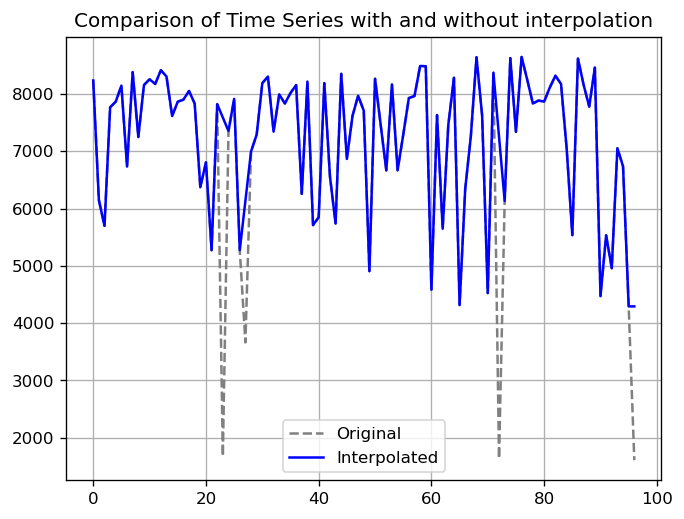

In [56]:
plt.figure(dpi = 120)

plt.plot(ndvi_data, color='gray', linestyle='dashed', label = 'Original')
plt.plot(ndvi_masked_data_interpolated['data'].values, color='blue', label = 'Interpolated')

plt.title('Comparison of Time Series with and without interpolation')
plt.legend()
plt.grid(True)
plt.show()

In [18]:
!pip install pandas
!pip install plotly
import pandas as pd
import plotly.express as px

In [19]:
cbers_df = pd.DataFrame({ 'BAND15': time_series.BAND15, 'BAND16': time_series.BAND16 }, 
                        index = pd.to_datetime(time_series.timeline))

cbers_df

,BAND15,BAND16
2016-01-01,4466.0,5422.0
2016-01-17,473.0,3550.0
2016-02-02,466.0,3278.0
2016-02-18,503.0,3285.0
2016-03-05,601.0,3375.0
...,...,...
2022-01-01,853.0,4178.0
2022-01-17,454.0,4252.0
2022-02-02,3238.0,5667.0
2022-02-18,588.0,4657.0


In [20]:
!pip install ipython

In [21]:
pip install --upgrade nbformat

Note: you may need to restart the kernel to use updated packages.


In [22]:
fig = px.line(cbers_df, x=cbers_df.index, y=['BAND15', 'BAND16'], title='CBERS-4/AWFI (BAND 15 and 16)', labels={
    'index': 'Date',
    'value': 'Spectral Reflectance (scaled)'
})

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [23]:
cbers4_coverage

name,common name,description,datatype,valid range,scale,nodata
NDVI,ndvi,Normalized Difference Vegetation Index,int16,"{'min': -10000.0, 'max': 10000.0}",0.0001,-9999.0
BAND16,nir,Band 16 (nir),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
CMASK,quality,Cloud Mask,uint8,"{'min': 0.0, 'max': 255.0}",1.0,0.0
BAND13,blue,Band 13 (blue),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
BAND14,green,Band 14 (green),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
BAND15,red,Band 15 (red),int16,"{'min': 0.0, 'max': 10000.0}",0.0001,-9999.0
CLEAROB,ClearOb,Clear Observation Count,uint8,"{'min': 1.0, 'max': 255.0}",1.0,0.0
PROVENANCE,Provenance,Provenance value Day of Year,int16,"{'min': 1.0, 'max': 366.0}",1.0,-1.0
TOTALOB,TotalOb,Total Observation Count,uint8,"{'min': 1.0, 'max': 255.0}",1.0,0.0
EVI,evi,Enhanced Vegetation Index,int16,"{'min': -10000.0, 'max': 10000.0}",0.0001,-9999.0


In [24]:
cb4_timeseries_cmask = cbers4_coverage.ts(

    attributes = ('CMASK'),

    latitude = -12.0,
    longitude = -53.989,

    start_date = "2016-01-01",
    end_date = "2022-03-21"
)

cb4_timeseries_cmask

Time Series CB4_64_16D_STK-1
 
 
 
 
 CMASK: [255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 255.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 127.0]
 
 
 
 
 timeline 
 
 
 
 2016-01-01T00:00:00 2016-01-17T00:00:00 2016-02-02T00:00:00 2016-02-18T00:00:00 2016-03-05T00:00:00 2016-03-21T00:00:00 2016-04-06T00:00:00 2016-04-22T00:00:00 2016-05-08T00:00:00 2016-05-24T00:00:00 2016-06-09T00:00:00 2016-06-25T00:00:00 2016-07-11T00:00:00 2016-07-27T00:00:00 2016-08-12T00:00:00 2016-08-28T00:00:00 2016-09-13T00:00:00 2016-09-29T00:00:00 2016-10-15T00:00:00 2016-10-31T00:00:00 2016-11-16T00:00:00 2016-12-02T00:00:00 2016-12-18T00:00:00 2017-01-01T00:00:00 2017-01-17T00:00:00 2017-02-02T00:00:00 2017-02-18T00:00:00 2017-03-06T00:00:00 2017-03-22T00:00:00 2017-04-07T00:00:00 2017-04-23T00:00:00 2017-05-09T00:00:00 2017-05-25T00:00:00 2017-06-10T00:00:00 2017-06-26T00:00:00 2017-07-12T00:00:00 2017-07-28T00:00:00 2017-08-13T00:00:00 2017-08-29T00:00:00 2017-09-14T00:00:00 2017-09-30T00:00:00 2017-10-16T00:00:00 2017-11-01T00:00:00 2017-11-17T00:00:00 2017-12-03T00:00:00 2017-12-19T00:00:00 2018-01-01T00:00:00 2018-01-17T00:00:00 2018-02-02T00:00:00 2018-02-18T00:00:00 2018-03-06T00:00:00 2018-03-22T00:00:00 2018-04-07T00:00:00 2018-04-23T00:00:00 2018-05-09T00:00:00 2018-05-25T00:00:00 2018-06-10T00:00:00 2018-06-26T00:00:00 2018-07-12T00:00:00 2018-07-28T00:00:00 2018-08-13T00:00:00 2018-08-29T00:00:00 2018-09-14T00:00:00 2018-09-30T00:00:00 2018-10-16T00:00:00 2018-11-01T00:00:00 2018-11-17T00:00:00 2018-12-03T00:00:00 2018-12-19T00:00:00 2019-01-01T00:00:00 2019-01-17T00:00:00 2019-02-02T00:00:00 2019-02-18T00:00:00 2019-03-06T00:00:00 2019-03-22T00:00:00 2019-04-07T00:00:00 2019-04-23T00:00:00 2019-05-09T00:00:00 2019-05-25T00:00:00 2019-06-10T00:00:00 2019-06-26T00:00:00 2019-07-12T00:00:00 2019-07-28T00:00:00 2019-08-13T00:00:00 2019-08-29T00:00:00 2019-09-14T00:00:00 2019-09-30T00:00:00 2019-10-16T00:00:00 2019-11-01T00:00:00 2019-11-17T00:00:00 2019-12-03T00:00:00 2019-12-19T00:00:00 2020-01-01T00:00:00 2020-01-17T00:00:00 2020-02-02T00:00:00 2020-02-18T00:00:00 2020-03-05T00:00:00 2020-03-21T00:00:00 2020-04-06T00:00:00 2020-04-22T00:00:00 2020-05-08T00:00:00 2020-05-24T00:00:00 2020-06-09T00:00:00 2020-06-25T00:00:00 2020-07-11T00:00:00 2020-07-27T00:00:00 2020-08-12T00:00:00 2020-08-28T00:00:00 2020-09-13T00:00:00 2020-09-29T00:00:00 2020-10-15T00:00:00 2020-10-31T00:00:00 2020-11-16T00:00:00 2020-12-02T00:00:00 2020-12-18T00:00:00 2021-01-01T00:00:00 2021-01-17T00:00:00 2021-02-02T00:00:00 2021-02-18T00:00:00 2021-03-06T00:00:00 2021-03-22T00:00:00 2021-04-07T00:00:00 2021-04-23T00:00:00 2021-05-09T00:00:00 2021-05-25T00:00:00 2021-06-10T00:00:00 2021-06-26T00:00:00 2021-07-12T00:00:00 2021-07-28T00:00:00 2021-08-13T00:00:00 2021-08-29T00:00:00 2021-09-14T00:00:00 2021-09-30T00:00:00 2021-10-16T00:00:00 2021-11-01T00:00:00 2021-11-17T00:00:00 2021-12-03T00:00:00 2021-12-19T00:00:00 2022-01-01T00:00:00 2022-01-17T00:00:00 2022-02-02T00:00:00 2022-02-18T00:00:00 2022-03-06T00:00:00

In [25]:
set(cb4_timeseries_cmask.values('CMASK'))




{127.0, 255.0}

In [26]:
cb4_timeseries = cbers4_coverage.ts(

    attributes = ('NDVI', 'CMASK'),

    latitude = -16.350000,
    longitude = -56.666668,

    start_date = "2016-01-01",
    end_date = "2022-03-21"

)


In [27]:
ndvi_timeline = pd.to_datetime(cb4_timeseries.timeline)
ndvi_timeline

DatetimeIndex(['2016-01-01', '2016-01-17', '2016-02-02', '2016-02-18',
               '2016-03-05', '2016-03-21', '2016-04-06', '2016-04-22',
               '2016-05-08', '2016-05-24',
               ...
               '2021-10-16', '2021-11-01', '2021-11-17', '2021-12-03',
               '2021-12-19', '2022-01-01', '2022-01-17', '2022-02-02',
               '2022-02-18', '2022-03-06'],
              dtype='datetime64[ns]', length=143, freq=None)

In [28]:
import numpy as np

ndvi_data = np.array(cb4_timeseries.NDVI)
ndvi_data

cmask_data = np.array(cb4_timeseries.CMASK)
cmask_data

array([255., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 255., 127., 127., 127., 127., 127., 127.,
       127., 127., 255., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       255., 127., 127., 127., 127., 127., 255., 127., 127., 127., 127.,
       127., 127., 127., 127., 127., 127., 127., 127., 127., 127., 127.,
       127., 127., 127., 255., 127., 255., 127., 127., 255., 127., 255.])

In [29]:
cmask_data = np.where(cmask_data == 255, np.nan, 1)
cmask_data

array([nan,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1., nan,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1., nan,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1., nan,  1.,  1.,  1.,  1.,  1., nan,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1., nan,  1., nan,  1.,  1., nan,  1., nan])

In [30]:
ndvi_data * cmask_data

array([  nan, 7648., 7510., 7344., 6976., 6171., 6241., 6334., 6143.,
       6668., 7125., 6924., 5285., 5072., 5137., 5118., 5207., 6494.,
       7993., 7852., 7853., 7736., 4276., 5556., 6379., 5461., 6489.,
       6567., 6394., 7415., 6487., 6367., 6014., 5623., 5293., 4736.,
       4722.,   nan, 4309., 4331., 4421., 4443., 5476., 7754., 6597.,
       7044.,   nan, 6279., 6253., 6540., 4371., 4195., 6287., 6141.,
       6399., 5621., 5603., 5356., 4892., 4566., 4117., 3612., 3426.,
       5681., 6837., 7305., 4855., 5998., 3978., 7384., 5597., 6542.,
       5570., 6534., 6349., 4057., 6793., 7125., 6650., 5059., 5225.,
       4597., 4354., 4191., 3645., 3615., 4531., 4638., 5305., 5795.,
       4473., 7102., 7333., 6888., 7257., 6044., 6194., 6119., 7002.,
       6227., 6245., 6090., 4751., 5677., 4854., 4684., 4250., 4194.,
       2916., 4531.,   nan, 4667., 5293., 5000., 5879., 5531.,   nan,
       7922., 7349., 7587., 6863., 5622., 6099., 6022., 5126., 4261.,
       4146., 3959.,

In [31]:
ndvi_masked_data = pd.DataFrame({ 'data': ndvi_data * cmask_data }, index = pd.to_datetime(ndvi_timeline))
ndvi_masked_data

,data
2016-01-01,NaN
2016-01-17,7648.0
2016-02-02,7510.0
2016-02-18,7344.0
2016-03-05,6976.0
...,...
2022-01-01,6609.0
2022-01-17,8070.0
2022-02-02,NaN
2022-02-18,7757.0


In [32]:
ndvi_masked_data[ndvi_masked_data['data'].isna()]

,data
2016-01-01,NaN
2017-08-13,NaN
2018-01-01,NaN
2020-10-15,NaN
2021-01-17,NaN
2021-11-17,NaN
2021-12-19,NaN
2022-02-02,NaN
2022-03-06,NaN


In [33]:
ndvi_masked_data_interpolated = ndvi_masked_data.interpolate()
ndvi_masked_data_interpolated

,data
2016-01-01,NaN
2016-01-17,7648.0
2016-02-02,7510.0
2016-02-18,7344.0
2016-03-05,6976.0
...,...
2022-01-01,6609.0
2022-01-17,8070.0
2022-02-02,7913.5
2022-02-18,7757.0


In [34]:
ndvi_masked_data_interpolated[ndvi_masked_data_interpolated['data'].isna()]

,data
2016-01-01,NaN


In [35]:
import matplotlib.pyplot as plt

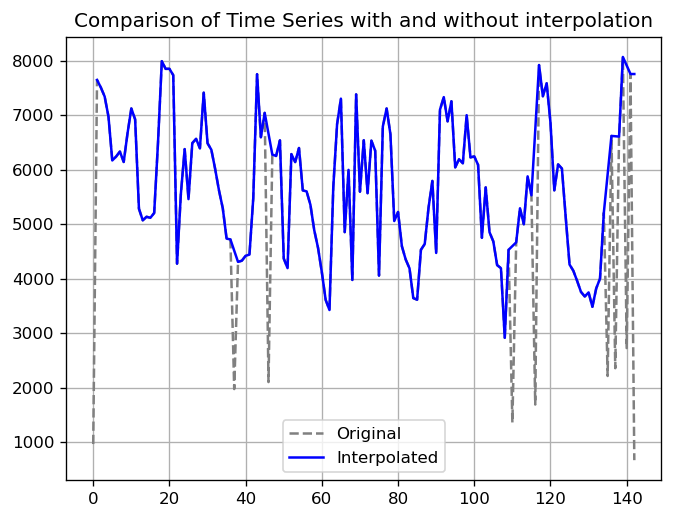

In [37]:
plt.figure(dpi = 120)

plt.plot(ndvi_data, color='gray', linestyle='dashed', label = 'Original')
plt.plot(ndvi_masked_data_interpolated['data'].values, color='blue', label = 'Interpolated')

plt.title('Comparison of Time Series with and without interpolation')
plt.legend()
plt.grid(True)
plt.show()


In [72]:
!pip install scipy

In [73]:
import scipy

In [74]:
from scipy.signal import savgol_filter

In [75]:
median_smoothed = savgol_filter(ndvi_masked_data_interpolated['data'], window_length = 9, polyorder = 2)

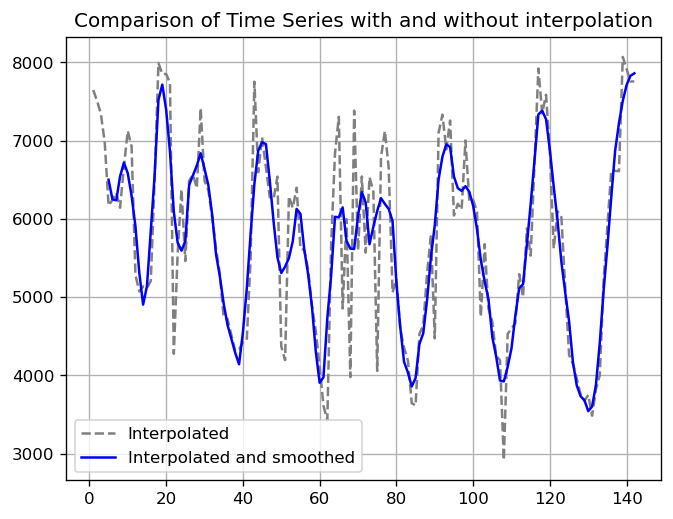

In [76]:
plt.figure(dpi = 120)

plt.plot(ndvi_masked_data_interpolated['data'].values, color='gray', linestyle='dashed', label = 'Interpolated')
plt.plot(median_smoothed, color='blue', label = 'Interpolated and smoothed')

plt.title('Comparison of Time Series with and without interpolation')
plt.legend()
plt.grid(True)
plt.show()

In [106]:
longitude = -55.126648  # Fixado
locations = []  # variável

for latitude in np.arange(-3.465305, -3.475, -0.0015):
    locations.append(( latitude, longitude ))

In [107]:
locations

[(-3.465305, -55.126648),
 (-3.466805, -55.126648),
 (-3.468305, -55.126648),
 (-3.469805, -55.126648),
 (-3.471305, -55.126648),
 (-3.472805, -55.126648),
 (-3.474305, -55.126648)]

In [108]:
!pip install folium

In [109]:
import folium

In [110]:
m = folium.Map(
    location = [-3.465305, -55.126648],
    zoom_start = 15,
)

tile = folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True
       ).add_to(m)

In [111]:
for location in locations:
    folium.Circle(
        fill=True,  # Preenchimento
        color = 'orange',  # Cor
        location=location,  # Localização
    ).add_to(m)

m

In [112]:
agriculture_time_series = []

for location in locations:
    latitude, longitude = location

    time_series = cbers4_coverage.ts(attributes=('NDVI'),
                                     latitude=float(latitude), longitude=float(longitude),
                                     start_date="2017-01-01", end_date="2022-03-21")

    agriculture_time_series.append(time_series.values('NDVI'))


In [113]:
len(agriculture_time_series)

7

In [114]:
median = np.median(agriculture_time_series, axis = 0)
median

array([-2223.,  8524.,  2024.,  6377.,  2916.,  1881.,  7787.,   970.,
        7189.,  7263.,  8628.,  8506.,  8388.,  7783.,  8338.,  7843.,
        8242.,  6426.,  6474.,  7722.,  5756.,  3299.,  1314.,  4581.,
        2581., -9999., -9999.,  7167.,  3333.,  5284.,  7479.,  2126.,
        6760.,  8294.,  6742.,  8278.,  4356.,  6254.,  8106.,  7843.,
        8381.,  6943.,  6336.,  4683.,  5108.,  8033.,  7737.,  1589.,
        5450.,  4296.,  5978.,  2941.,  1395.,  8147.,  6465.,  7618.,
        8035.,  7939.,  6817.,  8443.,  8322.,  6779.,  5914.,  5214.,
        6029.,  2615.,  8181.,  6316.,  6162.,  4057.,  7752.,  1181.,
        7080.,  7910.,   990.,  6066.,  4549.,  7977.,  8020.,  8946.,
        8274.,  8829.,  8781.,  8622.,  6323.,  8859.,  8371.,  8560.,
        6991.,  3281.,  8335.,  8692.,  4443.,  7929., -9999.,  7128.,
        2881.,  2986.,  8361.,  5214.,  8711.,  8319.,  8355.,  7634.,
        8481.,  6125.,  8580.,  7077.,  8444.,  4742.,  6975.,  5874.,
      

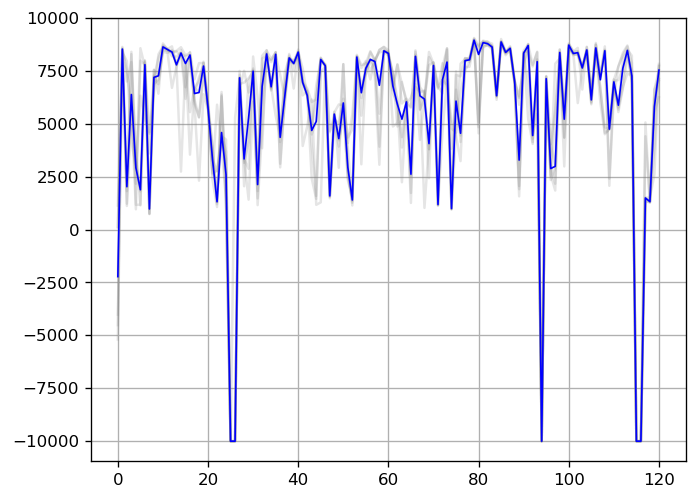

In [115]:
plt.figure(dpi = 120)

#
# Criando plot das séries temporais originais
#
for i in range(len(agriculture_time_series)):
    plt.plot(agriculture_time_series[i], color = 'grey', alpha = .2)

plt.plot(median, color='blue', linewidth = 1)

plt.grid(True)
plt.show()

We found an overall increasing trend in the NDVI for Nepal over 1981–2015. The RF analysis suggests that this trend is not primarily due to changes in climate (temperature and precipitation), but correlates best with an increasing atmospheric CO2 level, although precipitation and temperature are more important for explaining the interannual NDVI variability. Similarly, ecosystem models suggest that most of the observed increase in the seasonal amplitude of atmospheric CO2, indicative of increasing plant growth in the Northern Hemisphere over recent decades, is due to CO2 fertilization, and climate and land-use changes play secondary roles [5]. An increasing trend in global net primary productivity, particularly in tropical forests, has also been identified on the basis of satellite imagery for 1982–1999 and is attributed primarily to CO2 fertilization [2]. On the other hand, in boreal areas, warming has been a major driver of longer growing seasons and higher productivity [51,52], while in
Month
Month Month
Month Month
Remote Sens. 2017, 9, 986 12 of 15
arid and semiarid areas, moisture availability is a primary modulator of vegetation growth [15,53–55].

In [ ]:
plt.imshow(color=red, cmap='gray');

In [7]:
pip install -U esda

  Using cached esda-2.4.3.tar.gz (116 kB)
  Preparing metadata (setup.py) ... done
  Created wheel for esda: filename=esda-2.4.3-py3-none-any.whl size=122765 sha256=af60306025d68f99c3c99d94d79be1199d4ddeef58a760f7fb94fd14c6546678
  Stored in directory: /Users/bonnymcclain/Library/Caches/pip/wheels/ed/88/61/8705bb427b9aeb4ded8f07eb8ea3e8cada26881368c75619cb
Successfully built esda
Note: you may need to restart the kernel to use updated packages.


In [8]:
!pip install libpysal

In [1]:
!pip install seaborn

In [3]:
!pip install geopandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 26.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 32.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.2 MB/s eta 0:00:00


In [13]:
!pip install mapclassify

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.5 MB/s eta 0:00:00 0:00:01m


In [4]:
from esda.moran import Moran
from libpysal.weights import Queen, KNN
import seaborn
import pandas
import geopandas
import numpy
import matplotlib.pyplot as plt
import mapclassify

In [29]:
import contextily
import cenpy

In [83]:
cenpy.products.ACS()

Connection to ACS 5-Year Detailed Tables(ID: https://api.census.gov/data/id/ACSDT5Y2017)
With MapServer: Census ACS 2017 WMS

In [24]:
db = geopandas.read_file("https://geographicdata.science/book/_downloads/f2341ee89163afe06b42fc5d5ed38060/sandiego_tracts.gpkg")

In [25]:
db.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 628 entries, 0 to 627
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   GEOID                628 non-null    object  
 1   median_age           628 non-null    float64 
 2   total_pop            628 non-null    float64 
 3   total_pop_white      628 non-null    float64 
 4   tt_work              628 non-null    float64 
 5   hh_total             628 non-null    float64 
 6   hh_female            628 non-null    float64 
 7   total_bachelor       628 non-null    float64 
 8   median_hh_income     628 non-null    float64 
 9   income_gini          628 non-null    float64 
 10  total_housing_units  628 non-null    float64 
 11  total_rented         628 non-null    float64 
 12  median_no_rooms      628 non-null    float64 
 13  median_house_value   628 non-null    float64 
 14  NAME                 628 non-null    object  
 15  state          

In [22]:
db.head()

,geoid,name,B17001001,"B17001001, Error",B17001002,"B17001002, Error",B17001003,"B17001003, Error",B17001004,"B17001004, Error",...,"B17001055, Error",B17001056,"B17001056, Error",B17001057,"B17001057, Error",B17001058,"B17001058, Error",B17001059,"B17001059, Error",geometry
0,05000US06037,"Los Angeles County, CA",9884138.0,2756.0,1401656.0,14911.0,630981.0,9031.0,56754.0,1717.0,...,2176.0,594551.0,2076.0,542802.0,2337.0,366462.0,1910.0,280798.0,1981.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",3845.0,453.0,434.0,227.0,274.0,156.0,0.0,13.0,...,98.0,323.0,126.0,287.0,108.0,216.0,97.0,115.0,70.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",4086.0,855.0,181.0,129.0,46.0,40.0,11.0,16.0,...,55.0,354.0,152.0,350.0,90.0,250.0,85.0,240.0,148.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3775.0,474.0,638.0,282.0,319.0,150.0,36.0,46.0,...,68.0,398.0,199.0,248.0,91.0,131.0,52.0,86.0,57.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",3757.0,655.0,774.0,446.0,422.0,279.0,0.0,13.0,...,116.0,245.0,108.0,109.0,78.0,67.0,47.0,118.0,174.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."


In [16]:
cluster_variables = ["pop100","hu100"]

In [74]:
cluster_variables = [
    "median_house_value",  # Median house value
    "pct_white",  # % tract population that is white
    "pct_rented",  # % households that are rented
    "pct_hh_female",  # % female-led households
    "pct_bachelor",  # % tract population with a Bachelors degree
    "median_no_rooms",  # Median n. of rooms in the tract's households
    "income_gini",  # Gini index measuring tract wealth inequality
    "median_age",  # Median age of tract population
    "tt_work",  # Travel time to work
]

In [ ]:
f, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))
# Make the axes accessible with single indexing
axs = axs.flatten()
# Start a loop over all the variables of interest
for i, col in enumerate(cluster_variables):
    # select the axis where the map will go
    ax = axs[i]
    # Plot the map
    db.plot(
        column=col,
        ax=ax,
        scheme="Quantiles",
        linewidth=0,
        cmap="RdPu",
    )
    # Remove axis clutter
    ax.set_axis_off()
    # Set the axis title to the name of variable being plotted
    ax.set_title(col)
# Display the figure
plt.show()

In [76]:
w = Queen.from_dataframe(db)

In [77]:
# Set seed for reproducibility
numpy.random.seed(123456)
# Calculate Moran's I for each variable
mi_results = [
    Moran(db[variable], w) for variable in cluster_variables
]
# Structure results as a list of tuples
mi_results = [
    (variable, res.I, res.p_sim)
    for variable, res in zip(cluster_variables, mi_results)
]
# Display on table
table = pandas.DataFrame(
    mi_results, columns=["Variable", "Moran's I", "P-value"]
).set_index("Variable")
table

,Moran's I,P-value
Variable,,
median_house_value,0.646618,0.001
pct_white,0.602079,0.001
pct_rented,0.451372,0.001
pct_hh_female,0.282239,0.001
pct_bachelor,0.433082,0.001
median_no_rooms,0.538996,0.001
income_gini,0.295064,0.001
median_age,0.381440,0.001
tt_work,0.102748,0.001


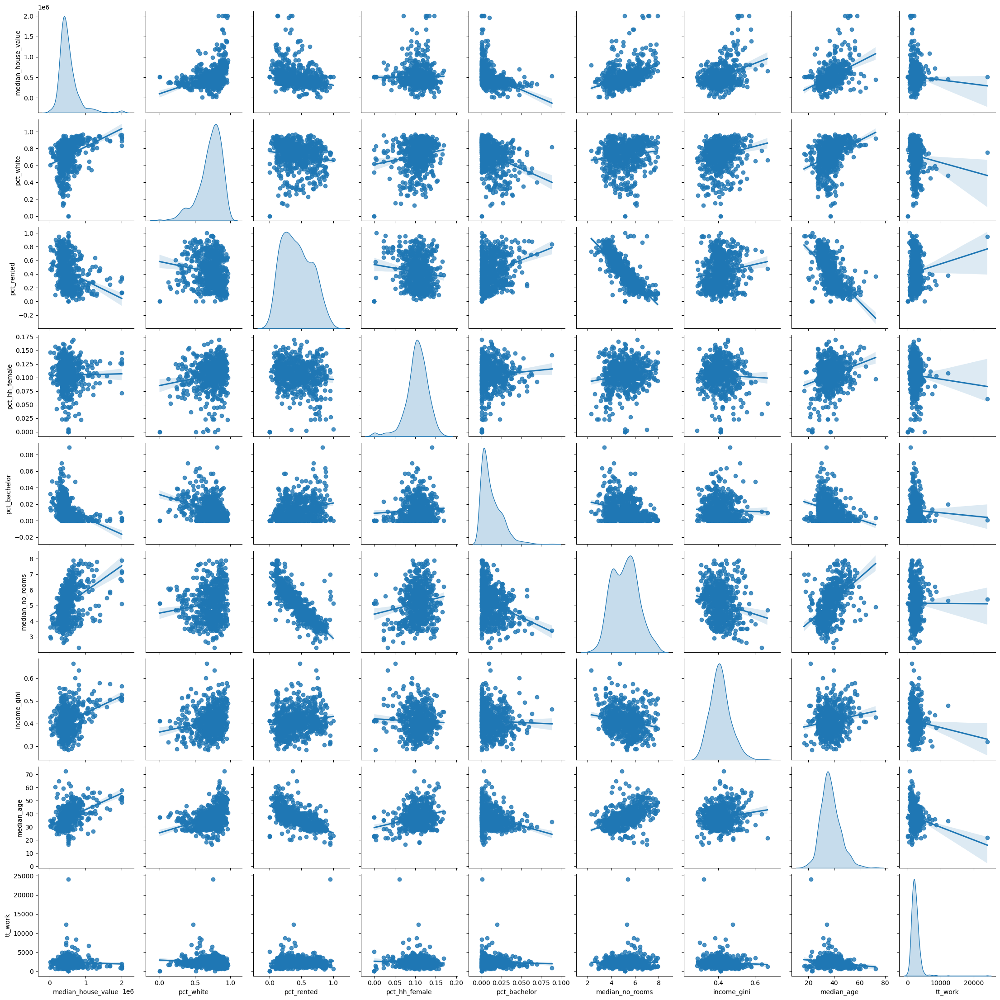

In [78]:
_ = seaborn.pairplot(
    db[cluster_variables], kind="reg", diag_kind="kde"
)

https://contextily.readthedocs.io/en/latest/friends_cenpy_osmnx.html

In [73]:
cenpy.tiger.available()

[{'name': 'AIANNHA', 'type': 'MapServer'},
 {'name': 'CBSA', 'type': 'MapServer'},
 {'name': 'Hydro', 'type': 'MapServer'},
 {'name': 'Labels', 'type': 'MapServer'},
 {'name': 'Legislative', 'type': 'MapServer'},
 {'name': 'Places_CouSub_ConCity_SubMCD', 'type': 'MapServer'},
 {'name': 'PUMA_TAD_TAZ_UGA_ZCTA', 'type': 'MapServer'},
 {'name': 'Region_Division', 'type': 'MapServer'},
 {'name': 'School', 'type': 'MapServer'},
 {'name': 'Special_Land_Use_Areas', 'type': 'MapServer'},
 {'name': 'State_County', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2012', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2013', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2014', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2015', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2016', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2017', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2018', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2019', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2021', 'type': 'MapServer'},

In [45]:
acs = cenpy.products.ACS(2019)

In [67]:
acs

Connection to American Community Survey: 5-Year Estimates: Detailed Tables 5-Year(ID: https://api.census.gov/data/id/ACSDT5Y2019)
With MapServer: Census ACS 2019 WMS

In [68]:
vars_to_download = {
    "B25077_001E": "median_house_value",  # Median house value
    "B02001_002E": "total_pop_white",     # Total white population
    "B01003_001E": "total_pop",           # Total population
    "B25003_003E": "total_rented",        # Total rented occupied
    "B25001_001E": "total_housing_units", # Total housing units
    "B09019_006E": "hh_female",           # Female households
    "B09019_001E": "hh_total",            # Total households
    "B15003_002E": "total_bachelor",      # Total w/ Bachelor degree
    "B25018_001E": "median_no_rooms",     # Median number of rooms
    "B19083_001E": "income_gini",         # Gini index of income inequality
    "B01002_001E": "median_age",          # Median age
    "B08303_001E": "tt_work",              # Aggregate travel time to work
    "B19013_001E": "median_hh_income"     # Median household income
}


In [ ]:
%%time
db = acs.from_msa("Los Angeles","County Subdivision",
                  level="tract",
                  variables=vars_to_download
                 )

In [71]:
db.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   STE_CODE_2021                  9 non-null      object  
 1   STE_NAME_2021                  9 non-null      object  
 2   Median_age_persons             9 non-null      float64 
 3   Median_mortgage_repay_monthly  9 non-null      float64 
 4   Median_tot_prsnl_inc_weekly    9 non-null      float64 
 5   Median_rent_weekly             9 non-null      float64 
 6   Median_tot_fam_inc_weekly      9 non-null      float64 
 7   Average_num_psns_per_bedroom   9 non-null      float64 
 8   Median_tot_hhd_inc_weekly      9 non-null      float64 
 9   Average_household_size         9 non-null      float64 
 10  AREA_ALBERS_SQKM               9 non-null      float64 
 11  geometry                       9 non-null      geometry
dtypes: float64(9), geometry(1), obje

In [110]:
db = geopandas.read_file("/Users/bonnymcclain/Downloads/Geopackage_2021_G02_AUST_GDA2020/G02_AUST_GDA2020.gpkg")

In [111]:
db.head()

,STE_CODE_2021,STE_NAME_2021,Median_age_persons,Median_mortgage_repay_monthly,Median_tot_prsnl_inc_weekly,Median_rent_weekly,Median_tot_fam_inc_weekly,Average_num_psns_per_bedroom,Median_tot_hhd_inc_weekly,Average_household_size,AREA_ALBERS_SQKM,geometry
0,1,New South Wales,39.0,2167.0,813.0,420.0,2185.0,0.9,1829.0,2.6,8.007977e+05,"MULTIPOLYGON (((159.06230 -31.50886, 159.06218..."
1,2,Victoria,38.0,1859.0,803.0,370.0,2136.0,0.8,1759.0,2.5,2.274962e+05,"MULTIPOLYGON (((146.29286 -39.15778, 146.29341..."
2,3,Queensland,38.0,1733.0,787.0,365.0,2024.0,0.8,1675.0,2.5,1.730171e+06,"MULTIPOLYGON (((142.53140 -10.68301, 142.53072..."
3,4,South Australia,41.0,1500.0,734.0,300.0,1889.0,0.8,1455.0,2.4,9.842314e+05,"MULTIPOLYGON (((140.66025 -38.06256, 140.66006..."
4,5,Western Australia,38.0,1842.0,848.0,340.0,2214.0,0.8,1815.0,2.5,2.526632e+06,"MULTIPOLYGON (((117.86953 -35.19108, 117.86961..."


In [112]:
cluster_variables =["Median_mortgage_repay_monthly","Median_age_persons","Median_tot_prsnl_inc_weekly","Median_rent_weekly","Median_tot_fam_inc_weekly","Average_num_psns_per_bedroom","Median_tot_hhd_inc_weekly","Average_household_size",]

https://geographicdata.science/book/notebooks/10_clustering_and_regionalization.html#data

https://colab.research.google.com/github/gdsbook/book/blob/master/notebooks/10_clustering_and_regionalization.ipynb#scrollTo=parliamentary-bouquet

/Users/bonnymcclain/opt/miniconda3/envs/ox/lib/python3.10/site-packages/mapclassify/classifiers.py:238: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
/Users/bonnymcclain/opt/miniconda3/envs/ox/lib/python3.10/site-packages/mapclassify/classifiers.py:241: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)
/Users/bonnymcclain/opt/miniconda3/envs/ox/lib/python3.10/site-packages/mapclassify/classifiers.py:238: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
/Users/bonnymcclain/opt/miniconda3/envs/ox/lib/python3.10/site-packages/mapclassify/classifiers.py:241: UserWarning: Warning: setting k to 4
  Warn("Warning: setting k to %d" % k_q, UserWarning)


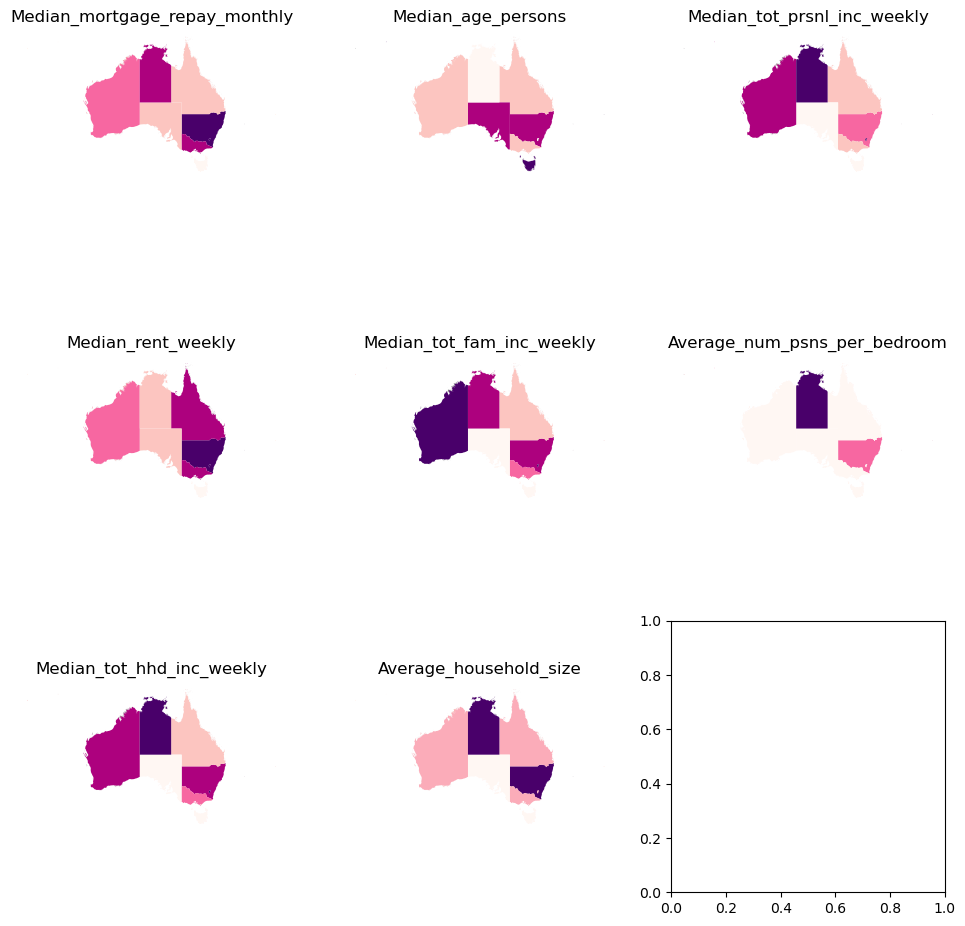

In [113]:
f, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))
# Make the axes accessible with single indexing
axs = axs.flatten()
# Start a loop over all the variables of interest
for i, col in enumerate(cluster_variables):
    # select the axis where the map will go
    ax = axs[i]
    # Plot the map
    db.plot(
        column=col,
        ax=ax,
        scheme="quantiles",
        linewidth=0,
        cmap="RdPu",
    )
    # Remove axis clutter
    ax.set_axis_off()
    # Set the axis title to the name of variable being plotted
    ax.set_title(col)
# Display the figure
plt.show()

https://s4.ad.brown.edu/projects/diversity/Data/Download5.htm

In [1]:
### for spatial data
import geopandas as gpd

### for plotting
import matplotlib.pyplot as plt

### for network analysis
import networkx as nx

### for street network analysis
import osmnx as ox

### for basemaps
import contextily as ctx

import plotly.express as px

In [25]:
race = gpd.read_file('/Users/bonnymcclain/Downloads/acs2020_5yr_B03002_14000US06037293304-2/acs2020_5yr_B03002_14000US06037293304.shp')

In [26]:
race.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1122 entries, 0 to 1121
Data columns (total 45 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   geoid       1122 non-null   object  
 1   name        1122 non-null   object  
 2   B03002001   1122 non-null   float64 
 3   B03002001e  1122 non-null   float64 
 4   B03002002   1122 non-null   float64 
 5   B03002002e  1122 non-null   float64 
 6   B03002003   1122 non-null   float64 
 7   B03002003e  1122 non-null   float64 
 8   B03002004   1122 non-null   float64 
 9   B03002004e  1122 non-null   float64 
 10  B03002005   1122 non-null   float64 
 11  B03002005e  1122 non-null   float64 
 12  B03002006   1122 non-null   float64 
 13  B03002006e  1122 non-null   float64 
 14  B03002007   1122 non-null   float64 
 15  B03002007e  1122 non-null   float64 
 16  B03002008   1122 non-null   float64 
 17  B03002008e  1122 non-null   float64 
 18  B03002009   1122 non-null   float64 
 19

In [27]:
race.head(3)

,geoid,name,B03002001,B03002001e,B03002002,B03002002e,B03002003,B03002003e,B03002004,B03002004e,...,B03002017e,B03002018,B03002018e,B03002019,B03002019e,B03002020,B03002020e,B03002021,B03002021e,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",3923.0,460.0,2960.0,376.0,2393.0,353.0,17.0,18.0,...,13.0,260.0,219.0,150.0,129.0,124.0,118.0,26.0,42.0,"POLYGON ((-118.30229 34.25870, -118.30091 34.2..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",4119.0,858.0,3937.0,865.0,3159.0,832.0,148.0,143.0,...,13.0,36.0,42.0,45.0,58.0,41.0,57.0,4.0,6.0,"POLYGON ((-118.30334 34.27371, -118.30330 34.2..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3775.0,474.0,2254.0,228.0,1659.0,280.0,94.0,104.0,...,13.0,586.0,276.0,283.0,276.0,252.0,271.0,31.0,40.0,"POLYGON ((-118.28592 34.25227, -118.28592 34.2..."


In [28]:
race = race.drop([0])

In [29]:
list(race)


['geoid',
 'name',
 'B03002001',
 'B03002001e',
 'B03002002',
 'B03002002e',
 'B03002003',
 'B03002003e',
 'B03002004',
 'B03002004e',
 'B03002005',
 'B03002005e',
 'B03002006',
 'B03002006e',
 'B03002007',
 'B03002007e',
 'B03002008',
 'B03002008e',
 'B03002009',
 'B03002009e',
 'B03002010',
 'B03002010e',
 'B03002011',
 'B03002011e',
 'B03002012',
 'B03002012e',
 'B03002013',
 'B03002013e',
 'B03002014',
 'B03002014e',
 'B03002015',
 'B03002015e',
 'B03002016',
 'B03002016e',
 'B03002017',
 'B03002017e',
 'B03002018',
 'B03002018e',
 'B03002019',
 'B03002019e',
 'B03002020',
 'B03002020e',
 'B03002021',
 'B03002021e',
 'geometry']

In [30]:
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002012',
 'geometry']

In [31]:
race = race[columns_to_keep]

In [32]:
race.head()


,geoid,name,B03002001,B03002002,B03002003,B03002004,B03002005,B03002006,B03002007,B03002008,B03002009,B03002012,geometry
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",4119.0,3937.0,3159.0,148.0,0.0,426.0,0.0,0.0,204.0,182.0,"POLYGON ((-118.30334 34.27371, -118.30330 34.2..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3775.0,2254.0,1659.0,94.0,0.0,390.0,0.0,6.0,105.0,1521.0,"POLYGON ((-118.28592 34.25227, -118.28592 34.2..."
3,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",3787.0,2605.0,2026.0,213.0,0.0,267.0,0.0,99.0,0.0,1182.0,"POLYGON ((-118.29945 34.25598, -118.29792 34.2..."
4,14000US06037101222,"Census Tract 1012.22, Los Angeles, CA",2717.0,1535.0,1466.0,4.0,0.0,65.0,0.0,0.0,0.0,1182.0,"POLYGON ((-118.29434 34.25233, -118.29318 34.2..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3741.0,3381.0,3009.0,172.0,0.0,139.0,0.0,0.0,61.0,360.0,"POLYGON ((-118.27822 34.25068, -118.27822 34.2..."


In [33]:
race.columns = ['geoid',
 'name',
 'total',
 'non hispanic',
 'white',
 'black',
 'native',
 'asian',
 'pacific islander',
 'non hispanic some other race',
 'non hispanic two or more races',
 'hispanic',
 'geometry']

In [34]:
race.head()

,geoid,name,total,non hispanic,white,black,native,asian,pacific islander,non hispanic some other race,non hispanic two or more races,hispanic,geometry
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",4119.0,3937.0,3159.0,148.0,0.0,426.0,0.0,0.0,204.0,182.0,"POLYGON ((-118.30334 34.27371, -118.30330 34.2..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3775.0,2254.0,1659.0,94.0,0.0,390.0,0.0,6.0,105.0,1521.0,"POLYGON ((-118.28592 34.25227, -118.28592 34.2..."
3,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",3787.0,2605.0,2026.0,213.0,0.0,267.0,0.0,99.0,0.0,1182.0,"POLYGON ((-118.29945 34.25598, -118.29792 34.2..."
4,14000US06037101222,"Census Tract 1012.22, Los Angeles, CA",2717.0,1535.0,1466.0,4.0,0.0,65.0,0.0,0.0,0.0,1182.0,"POLYGON ((-118.29434 34.25233, -118.29318 34.2..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3741.0,3381.0,3009.0,172.0,0.0,139.0,0.0,0.0,61.0,360.0,"POLYGON ((-118.27822 34.25068, -118.27822 34.2..."


In [35]:
race['percent non hispanic'] = race['non hispanic']/race['total']*100
race['percent hispanic'] = race['hispanic']/race['total']*100

In [36]:
race['percent white'] = race['white']/race['total']*100
race['percent black'] = race['black']/race['total']*100
race['percent native'] = race['native']/race['total']*100
race['percent asian'] = race['asian']/race['total']*100
race['percent pacific islander'] = race['pacific islander']/race['total']*100
race['percent non hispanic some other race'] = race['non hispanic some other race']/race['total']*100
race['percent non hispanic two or more races'] = race['non hispanic two or more races']/race['total']*100

In [37]:
race.head()


,geoid,name,total,non hispanic,white,black,native,asian,pacific islander,non hispanic some other race,...,geometry,percent non hispanic,percent hispanic,percent white,percent black,percent native,percent asian,percent pacific islander,percent non hispanic some other race,percent non hispanic two or more races
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",4119.0,3937.0,3159.0,148.0,0.0,426.0,0.0,0.0,...,"POLYGON ((-118.30334 34.27371, -118.30330 34.2...",95.581452,4.418548,76.693372,3.593105,0.0,10.342316,0.0,0.000000,4.952658
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3775.0,2254.0,1659.0,94.0,0.0,390.0,0.0,6.0,...,"POLYGON ((-118.28592 34.25227, -118.28592 34.2...",59.708609,40.291391,43.947020,2.490066,0.0,10.331126,0.0,0.158940,2.781457
3,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",3787.0,2605.0,2026.0,213.0,0.0,267.0,0.0,99.0,...,"POLYGON ((-118.29945 34.25598, -118.29792 34.2...",68.787959,31.212041,53.498812,5.624505,0.0,7.050436,0.0,2.614206,0.000000
4,14000US06037101222,"Census Tract 1012.22, Los Angeles, CA",2717.0,1535.0,1466.0,4.0,0.0,65.0,0.0,0.0,...,"POLYGON ((-118.29434 34.25233, -118.29318 34.2...",56.496135,43.503865,53.956570,0.147221,0.0,2.392344,0.0,0.000000,0.000000
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3741.0,3381.0,3009.0,172.0,0.0,139.0,0.0,0.0,...,"POLYGON ((-118.27822 34.25068, -118.27822 34.2...",90.376905,9.623095,80.433039,4.597701,0.0,3.715584,0.0,0.000000,1.630580


In [39]:
neighborhoods=gpd.read_file('https://opendata.arcgis.com/api/v3/datasets/d6c55385a0e749519f238b77135eafac_0/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1')

In [40]:
neighborhoods.head(3)

,OBJECTID,name,geometry
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."


In [41]:
income = gpd.read_file('/Users/bonnymcclain/Downloads/acs2020_5yr_B19013_14000US06037293304/acs2020_5yr_B19013_14000US06037293304.geojson')

In [42]:
income.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1122 entries, 0 to 1121
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             1122 non-null   object  
 1   name              1122 non-null   object  
 2   B19013001         1105 non-null   float64 
 3   B19013001, Error  1100 non-null   float64 
 4   geometry          1122 non-null   geometry
dtypes: float64(2), geometry(1), object(2)
memory usage: 44.0+ KB


In [43]:
income.head(5)

,geoid,name,B19013001,"B19013001, Error",geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",74625.0,27799.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",93125.0,15209.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",55682.0,9264.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
3,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",46274.0,13226.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101222,"Census Tract 1012.22, Los Angeles, CA",30016.0,9714.0,"MULTIPOLYGON (((-118.29434 34.25233, -118.2931..."


In [44]:
list(income)

['geoid', 'name', 'B19013001', 'B19013001, Error', 'geometry']

In [45]:
columns_to_keep_income = ['geoid',
 'name',
 'B19013001',
 'geometry']

In [46]:
income = income[columns_to_keep_income]

In [47]:
income.head(3)


,geoid,name,B19013001,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",74625.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",93125.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",55682.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."


In [48]:
income.columns = ['geoid',
 'name',
 'median household income in the past 12 months',
 'geometry']

In [49]:
income.head(3)

,geoid,name,median household income in the past 12 months,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",74625.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",93125.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",55682.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."


In [52]:
neighborhoods.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  114 non-null    int64   
 1   name      114 non-null    object  
 2   geometry  114 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 2.8+ KB


In [53]:
neighborhoods.head(3)

,OBJECTID,name,geometry
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."


In [54]:
income.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1121 entries, 1 to 1121
Data columns (total 4 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   geoid                                          1121 non-null   object  
 1   name                                           1121 non-null   object  
 2   median household income in the past 12 months  1104 non-null   float64 
 3   geometry                                       1121 non-null   geometry
dtypes: float64(1), geometry(1), object(2)
memory usage: 35.2+ KB


<AxesSubplot:ylabel='Frequency'>

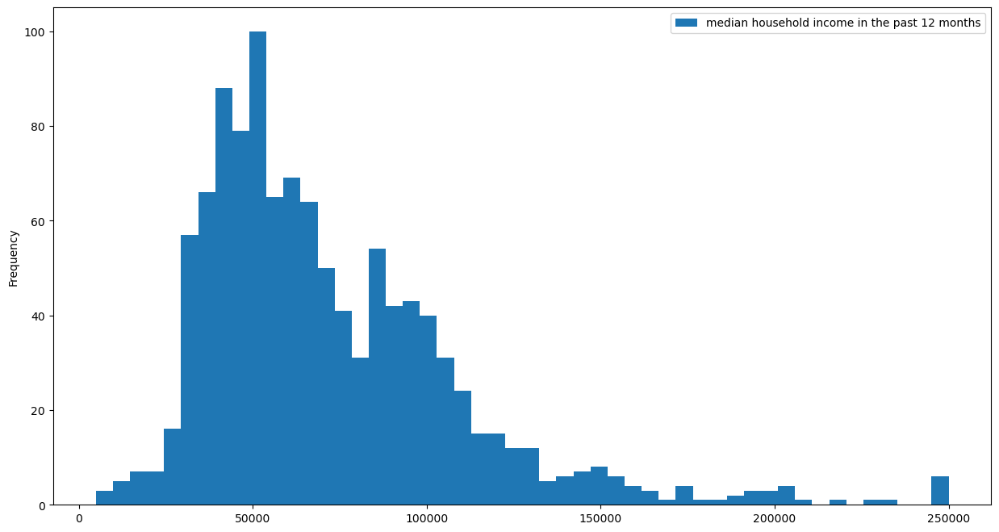

In [55]:
income.plot.hist(figsize=(15,8),bins=50)

In [56]:
points = income.copy()

In [57]:
points.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [58]:
neighborhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
points['geometry'] = points['geometry'].centroid


In [ ]:
neighborhoods_with_income = gpd.sjoin(income, neighborhoods, how="left", op='within')


In [61]:
neighborhoods_with_income.head(3)


,geoid,name_left,median household income in the past 12 months,geometry,index_right,OBJECTID,name_right
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",93125.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",NaN,NaN,NaN
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",55682.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",92.0,93.0,Tujunga
3,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",46274.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",92.0,93.0,Tujunga


In [63]:
income_add = neighbrohoods_with_income.dissolve(by='name_right', aggfunc='mean')
income_add.reset_index(inplace=True)
income_add= income_add.rename(columns = {'name_right':'name_right'})
income_add.head()

,name_right,geometry,median household income in the past 12 months,index_right,OBJECTID
0,Adams-Normandie,"POLYGON ((-118.29915 34.03273, -118.29807 34.0...",38745.500000,0.0,1.0
1,Arleta,"POLYGON ((-118.43617 34.22966, -118.43552 34.2...",64954.000000,1.0,2.0
2,Arlington Heights,"POLYGON ((-118.32366 34.04585, -118.32334 34.0...",33902.000000,2.0,3.0
3,Baldwin Hills/Crenshaw,"POLYGON ((-118.34724 34.01313, -118.34740 34.0...",32190.250000,4.0,5.0
4,Boyle Heights,"POLYGON ((-118.21877 34.02921, -118.21864 34.0...",48501.647059,9.0,10.0


In [64]:
bh = income_add[income_add['name_right'] == 'Boyle Heights']
bh.head()


,name_right,geometry,median household income in the past 12 months,index_right,OBJECTID
4,Boyle Heights,"POLYGON ((-118.21877 34.02921, -118.21864 34.0...",48501.647059,9.0,10.0


In [65]:
pp = income_add[income_add['name_right'] == 'Pacific Palisades']
pp.head()

,name_right,geometry,median household income in the past 12 months,index_right,OBJECTID
42,Pacific Palisades,"MULTIPOLYGON (((-118.52900 34.05014, -118.5289...",223922.0,68.0,69.0


In [66]:
sp = income_add[income_add['name_right'] == 'San Pedro']
sp.head()


,name_right,geometry,median household income in the past 12 months,index_right,OBJECTID
50,San Pedro,"POLYGON ((-118.28798 33.72175, -118.28798 33.7...",56643.666667,79.0,80.0


In [67]:
wl = income_add[income_add['name_right'] == 'Westlake']
wl.head()

,name_right,geometry,median household income in the past 12 months,index_right,OBJECTID
73,Westlake,"POLYGON ((-118.27140 34.05350, -118.27166 34.0...",39814.25,106.0,107.0


In [ ]:
bh_pp = bh.append(pp)
bh_pp_sp = bh_pp.append(sp)
bh_pp_sp_wl = bh_pp_sp.append(wl)


In [78]:
histo = px.bar(bh_pp_sp_wl, x='name_right',
               y="median household income in the past 12 months",
               title='Median Household Income Across Neighborhoods',
               labels={
                   'name_right':'Neighborhoods', 'income' : 'median household income in the past 12 months'}
              )
histo.show()

In [91]:
countrywide_parks=gpd.read_file('/Users/bonnymcclain/Downloads/Countywide_Parks_and_Open_Space_(Public_-_Hosted).geojson')

In [93]:
countrywide_parks.head()

,OBJECTID,UNIT_ID,LMS_ID,PARK_NAME,PARK_LBL,ACCESS_TYP,RPT_ACRES,GIS_ACRES,AGNCY_NAME,AGNCY_LEV,...,CENTER_LON,ADDRESS,CITY,ZIP,HOURS,PHONES,IS_COUNTY,Shape__Area,Shape__Length,geometry
0,1,30,23603.0,El Barrio Park,El Barrio Park,Open Access,2.093,2.092992,"Claremont, City of",City,...,-117.704423,400 Claremont Blvd,Claremont,91711,None,None,No,9.117036e+04,1451.547906,"POLYGON ((-117.70383 34.09747, -117.70421 34.0..."
1,2,56,NaN,El Dorado Park,El Dorado Park,Open Access,5.144,5.143217,"Lancaster, City of",City,...,-118.122109,44501 5th St E,Lancaster,93535,None,None,No,2.240376e+05,2192.277128,"POLYGON ((-118.12252 34.69275, -118.12252 34.6..."
2,3,62,3000015.0,Atlantic Avenue Park,Atlantic Avenue Park,Open Access,1.960,1.959610,"Los Angeles, County of",County,...,-118.155201,570 S. Atlantic Blvd.,Los Angeles,90022,March 1st to October 31st<br>\nOperating Hours...,General/Aquatics: (323) 260-2341; Reservations...,Yes,8.536029e+04,1139.269960,"POLYGON ((-118.15541 34.02582, -118.15540 34.0..."
3,4,72,22715.0,El Escorpion Park,El Escorpion Park,Open Access,66.914,66.338029,"Los Angeles, City of",City,...,-118.664169,6801 Sunset Ridge Ct,West Hills,91307,None,(818) 883-6641,No,2.889673e+06,7761.831975,"POLYGON ((-118.66713 34.19881, -118.66714 34.1..."
4,5,78,22860.0,El Marino Park/ El Marino Elementary,El Marino Park Elementary/El Marino Park,Open Access,3.200,1.650439,"Culver City, City of",City,...,-118.399233,11450 Port Rd,Culver City,90230,None,None,No,7.189283e+04,1215.415276,"POLYGON ((-118.39909 33.99221, -118.39910 33.9..."


<AxesSubplot:>

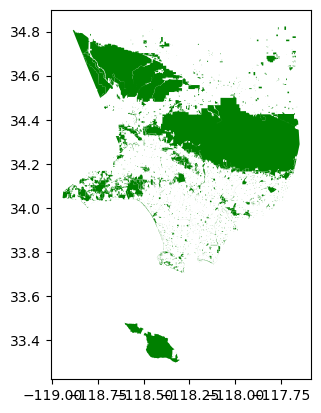

In [97]:
countrywide_parks.plot(color="green")